# Práctica semanal

## Primer ejercicio: *k*-NN

Retomemos nuestro dataset geográfico de provincias

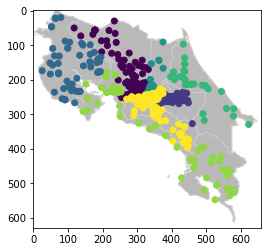

In [11]:
# Cargamos bibliotecas importantes
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing

# Cargamos el dataset de provincias
provincias_data = pd.read_csv('data/provincias_scaled.csv')

# Y mostramos los puntos en el mapa
# Primero, codifiquemos las provincias en 0-6
le = preprocessing.LabelEncoder()
le.fit(provincias_data['provincia'])
c = le.transform(provincias_data['provincia'])

# Leemos el archivo
im = plt.imread('data/mapaCR.png')
implot = plt.imshow(im)

# Escalamos los arrays en 0-1
p_long = provincias_data['long']
p_lat = provincias_data['lat']

# Dibujamos (con un pequeño offset empírico para que caiga en la imágen)
plt.scatter((im.shape[0]*p_long)*0.95 + 25, (im.shape[1]*(1-p_lat))*0.8 + 20, c=c)
plt.show()

Vamos a probar distintos valores de $k$ en nuestro clasificador *k*-NN para ver su efecto en un dataset multiclase.

In [12]:
# Obtenemos la envolvente convexa del territorio nacional
from scipy.spatial import Delaunay
points = np.array((p_long, p_lat)).T
hull = Delaunay(points)

# Generaremos un grid de prueba filtrado por la envolvente convexa
XX, YY = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
pos = np.vstack([XX.ravel(), YY.ravel()]).T
samples = np.array([x for x in pos if hull.find_simplex(x) >= 0]).T
samples

array([[0.82828283, 0.83838384, 0.84848485, ..., 0.2020202 , 0.21212121,
        0.22222222],
       [0.01010101, 0.01010101, 0.01010101, ..., 0.98989899, 0.98989899,
        0.98989899]])

In [9]:
provincias_data.head()

,long,lat,provincia
0,0.504035,0.603322,ALAJUELA
1,0.445985,0.603681,ALAJUELA
2,0.518164,0.629551,ALAJUELA
3,0.504035,0.603322,ALAJUELA
4,0.488361,0.582191,ALAJUELA


In [69]:
### EJERCICIO 1 (5pt)
### Entrenar modelos de clasificación KNN para k={1, 3, 5, 10, 30, 100, 200}
from sklearn.neighbors import KNeighborsClassifier

## Entrenaremos los modelos usando los datos 'points' contra la variable provincias_data['provincia'] como target
# osea X = points, y = provincias_data['provincia']
# debe generar un modelo para cada K,
# debe obtener el y_prima para cada modelo

k_list = [1, 3, 5, 10, 30, 100, 200]

X = points
y = provincias_data['provincia']

print(pos.shape, ' post shape')
print(X.shape, ' X shape')
print(samples.T.shape, ' samples shape')

knn_1 = KNeighborsClassifier(n_neighbors=1).fit(X, y)
knn_3 = KNeighborsClassifier(n_neighbors=3).fit(X, y)
knn_5 = KNeighborsClassifier(n_neighbors=5).fit(X, y)
knn_10 = KNeighborsClassifier(n_neighbors=10).fit(X, y)
knn_30 = KNeighborsClassifier(n_neighbors=30).fit(X, y)
knn_100 = KNeighborsClassifier(n_neighbors=100).fit(X, y)
knn_200 = KNeighborsClassifier(n_neighbors=200).fit(X, y)

# Predictions
preds_1 = knn_1.predict(samples.T)
preds_3 = knn_3.predict(samples.T)
preds_5 = knn_5.predict(samples.T)
preds_10 = knn_10.predict(samples.T)
preds_30 = knn_30.predict(samples.T)
preds_100 = knn_100.predict(samples.T)
preds_200 = knn_200.predict(samples.T)




(10000, 2)  post shape
(483, 2)  X shape
(5506, 2)  samples shape


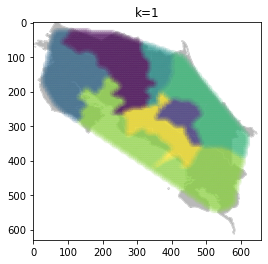

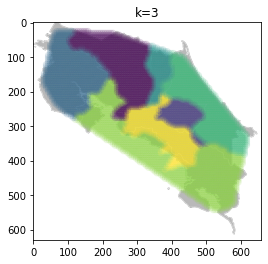

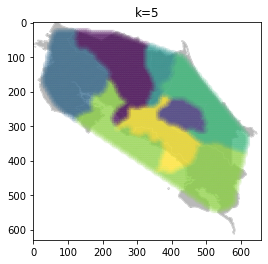

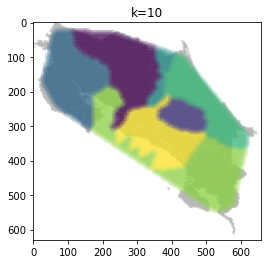

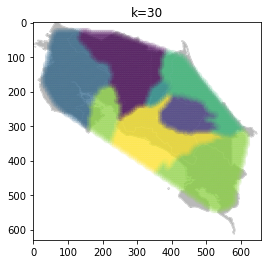

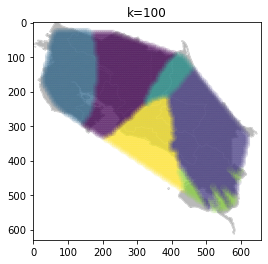

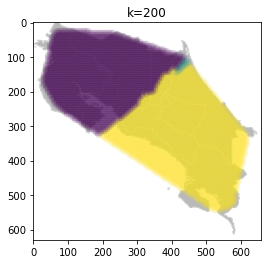

In [50]:
### Utilice esta celda para probar los resultados de sus modelos ###
# imprima el mapa de costa rica con cada y_prima obtenida en el ejercicio 1.

# ejemplo del codigo a utilizar
# debe imprimir el mapa para cada modelo generado en el ejercicio 1
# im = plt.imread('data/mapaCR.png')
# implot = plt.imshow(im)
# plt.scatter((samples[0]*im.shape[0])*0.95 + 25, ((1.0-samples[1])*im.shape[1])*0.8 + 20,c=le.transform(AKI_SU_Y_PRIMA), alpha=0.1)
# plt.title("k=#")
# plt.show()

def show_result(y_prima, title):
    im = plt.imread('data/mapaCR.png')
    implot = plt.imshow(im)
    plt.scatter((samples[0]*im.shape[0])*0.95 + 25, ((1.0-samples[1])*im.shape[1])*0.8 + 20,c=le.transform(y_prima), alpha=0.1)
    plt.title("k=" + str(title))
    plt.show()

show_result(preds_1, 1)
show_result(preds_3, 3)
show_result(preds_5, 5)
show_result(preds_10, 10)
show_result(preds_30, 30)
show_result(preds_100, 100)
show_result(preds_200, 200)


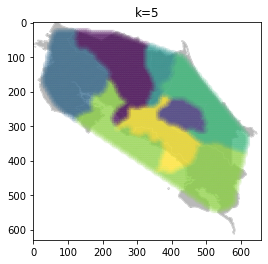

In [53]:
#La mejor parece ser cuand K=5
show_result(preds_5, 5)

## Segundo ejercicio: reducción de la dimensionalidad

Utilizaremos un dataset llamado ``waveform``, que tiene 40 columnas numéricas para clasificar formas de onda en tres clases ``0``, ``1`` y ``2``. 

In [68]:
# Leemos el dataset
waveform = pd.read_csv('data/waveform.csv')

# Tomamos las columnas independientes
wave_x_all = np.array(waveform.loc[:, waveform.columns != 'class'])

# Y la dependiente
wave_y_all = np.array(waveform['class'])

# Los separamos en dos conjuntos entrenamiento/pruebas
wave_x_train = wave_x_all[:4000]
wave_y_train = wave_y_all[:4000]
wave_x_test = wave_x_all[4000:]
wave_y_test = wave_y_all[4000:]

print(wave_x_all.shape, ' wave_x_all shape')
print(wave_y_all.shape, ' wave_y_all shape')

(5000, 40)  wave_x_all shape
(5000,)  wave_y_all shape


In [61]:
waveform.head()
# waveform.columns

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x32,x33,x34,x35,x36,x37,x38,x39,x40,class
0,-0.23,-1.21,1.20,1.23,-0.10,0.12,2.49,1.19,1.34,0.58,...,-0.86,-0.70,0.51,0.34,-0.13,-0.87,0.56,-0.53,0.29,2
1,0.38,0.38,-0.31,-0.09,1.52,1.35,1.49,3.81,2.33,1.34,...,1.28,1.40,0.00,-0.18,0.71,0.04,0.91,-0.79,0.22,0
2,-0.69,1.00,1.08,1.48,2.44,3.39,3.09,4.08,5.48,3.61,...,0.29,1.12,0.60,0.28,2.17,0.18,-0.09,-1.33,1.00,1
3,0.40,0.68,0.27,1.39,1.03,-0.32,-1.23,-0.50,0.11,0.87,...,0.43,-0.30,-0.07,-0.99,-0.75,1.11,1.35,-1.63,0.10,0
4,-0.81,1.59,-0.69,1.16,4.22,4.98,4.52,2.54,5.60,4.66,...,0.62,0.14,1.33,-1.87,1.48,-0.02,-0.58,0.93,0.40,1


In [82]:
## EJERCICIO 1 (1pt): Entrenar un modelo k-NN con k=10 y reportar la precisión (accuracy)
## Debe dar 0.826

knn_waveform = KNeighborsClassifier(n_neighbors=10).fit(wave_x_train, wave_y_train)

preds_waveform = knn_waveform.predict(wave_x_test)

accuracy = (preds_waveform == wave_y_test).mean()

print('accuracy ', accuracy)

accuracy  0.826


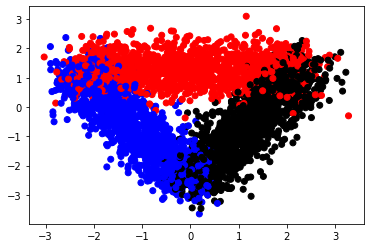

In [89]:
## EJERCICIO 2 (2pt): Reducir la dimensionalidad utilizando análisis de discriminante lineal a 2 dimensiones 
## y dibujarlo
## IMPORTANTE: utilizar el mismo modelo para reducir los datos de prueba
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(n_components=2).fit(wave_x_train, wave_y_train)

lda_wave_x_train = LinearDiscriminantAnalysis(n_components=2).fit(wave_x_train, wave_y_train)
lda_wave_x_test = LinearDiscriminantAnalysis(n_components=2).fit(wave_x_test, wave_y_test)

wave_x_reduced_train = lda_wave_x_train.transform(wave_x_train).T
wave_x_reduced_test = lda_wave_x_test.transform(wave_x_test).T

# Imprimit el training set REDUCIDO a 2 componentes
### REEMPLAZE LOS VALORES TRAIN_SET_REDUCED_X1, TRAIN_SET_REDUCED_X1 & VARIABLE_Y_TRAIN
plt.scatter(wave_x_reduced_train[0], wave_x_reduced_train[1], c=['red' if x==0 else 'blue' if x==1 else 'black' for x in wave_y_train])

In [102]:
## EJERCICIO 3 (2pt): Entrenar un clasificador k-NN con los datos reducidos por discriminante lineal. 
## Con n_neighbors=10 
## debe dar 0.848

# Usar X = wave_x_reduced_train.T, y = wave_y_train
# imprimir el accuracy

def calcular_accuracy(X, y):
    knn = KNeighborsClassifier(n_neighbors=10).fit(X, y)
    preds = knn.predict(wave_x_reduced_test.T)

    return (preds == wave_y_test).mean()

accuracy_reduced = calcular_accuracy(wave_x_reduced_train.T, wave_y_train)

print('Accuracy Reduced: ', accuracy_reduced)

Accuracy Reduced:  0.752
